<a href="https://colab.research.google.com/github/Marcel-12345/PCVK_Ganjil_2026/blob/main/PCVKweek2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

No. 1


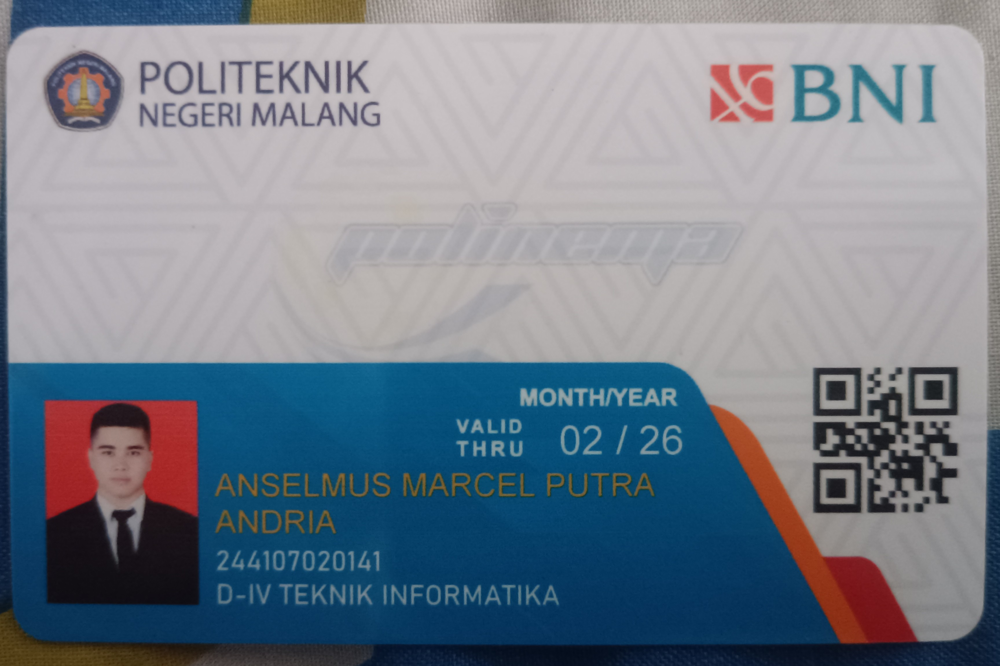

Resolusi gambar:  3455 x 2303
No. 2 Menampilkan Gambar


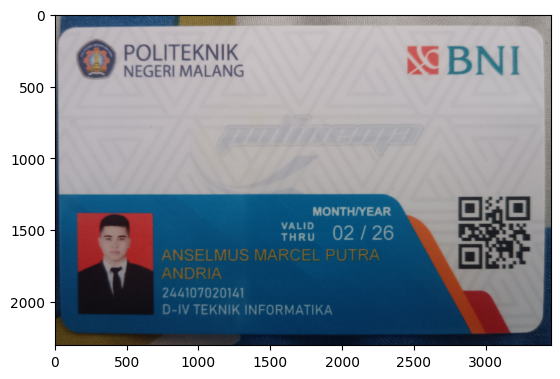

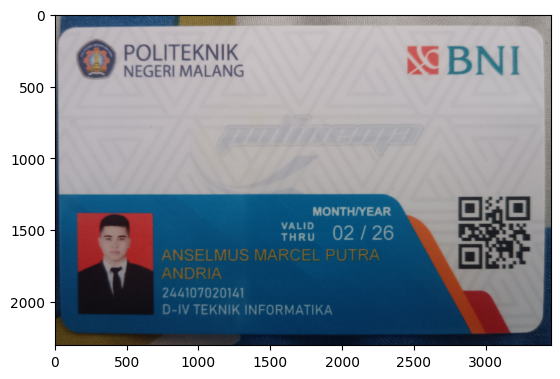

No. 3 Menampilkan citra Grayscale


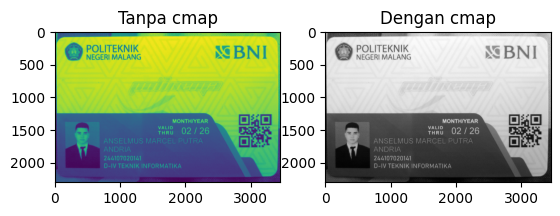

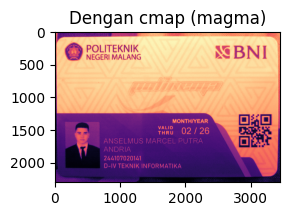

No. 4 Melakukan resizing
Resolusi gambar:  1500 x 1000


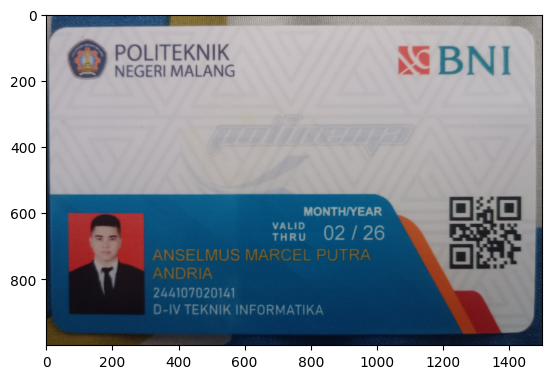

No. 5 Melakukan Flipping


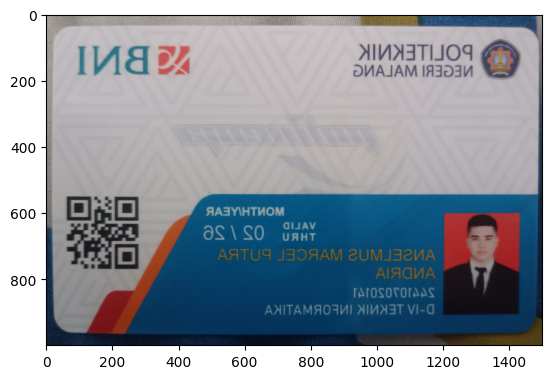

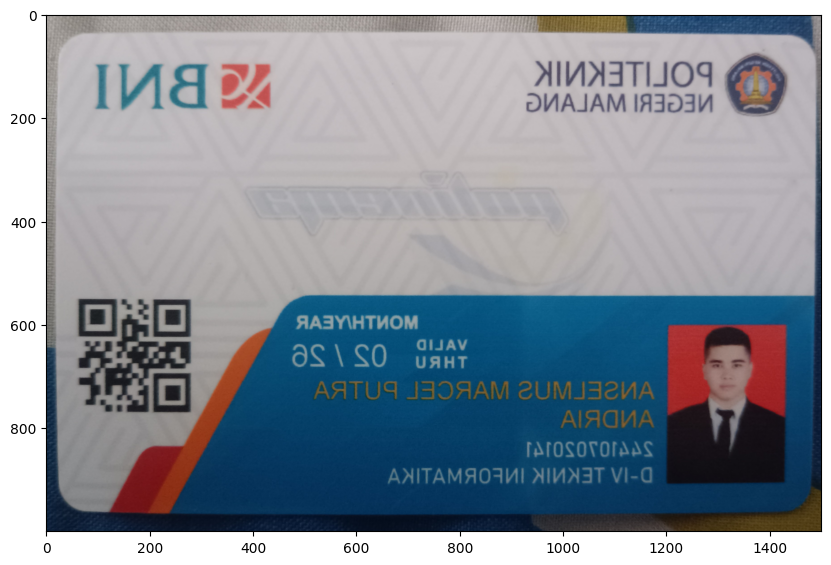

No. 6 Membuat bentuk Geometri 2D dari OpenCV
int16


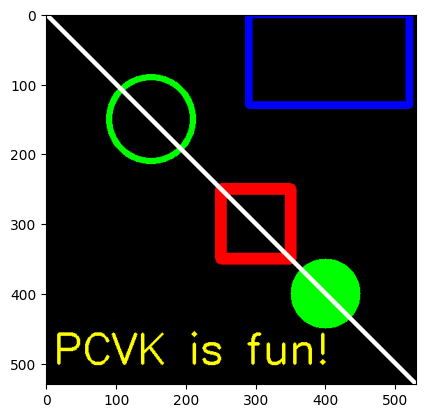

int32


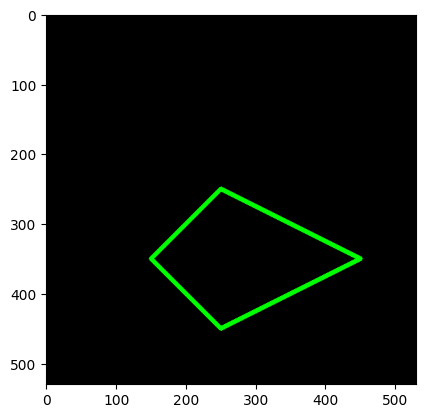

In [43]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

#1
print("No. 1")

img = cv.imread('/content/drive/MyDrive/PCVK/ktm_crop.jpg')
cv2_imshow(img)
print("Resolusi gambar: ", img.shape[1], "x", img.shape[0])
plt.imshow(img) #format warna BGR

#2 Menampilkan Gambar
print("No. 2 Menampilkan Gambar")

img = cv.imread('/content/drive/MyDrive/PCVK/ktm_crop.jpg')
img2 = cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(img2) #konversi channel BGR -> RGB
plt.show()

img = cv.imread('/content/drive/MyDrive/PCVK/ktm_crop.jpg')
plt.imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB)) #konversi channel BGR -> RGB
plt.show()

#3 Menampilkan citra Grayscale
print("No. 3 Menampilkan citra Grayscale")

img_gray = cv.imread('/content/drive/MyDrive/PCVK/ktm_crop.jpg', cv. IMREAD_GRAYSCALE)
# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')
# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')
plt.show()
# Dengan cmap (magma)
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='magma')
plt.title('Dengan cmap (magma)')
plt.show()

#4 Melakukan resizing
print("No. 4 Melakukan resizing")

imgRGB = cv.cvtColor (img,cv.COLOR_BGR2RGB) #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (1500,1000)) # contohnya 1500 x 1000
plt.imshow(img_output)
print("Resolusi gambar: ", img_output.shape[1], "x", img_output.shape[0])
plt.show()

#5 Melakukan Flipping
print("No. 5 Melakukan Flipping")

imgFlip=cv.flip(img_output, 1)
plt.imshow(imgFlip)
plt.show()

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)
plt.show()

#6 Membuat bentuk Geometri 2D dari OpenCV
print("No. 6 Membuat bentuk Geometri 2D dari OpenCV")

#int16
print("int16")
black_img = np.zeros (shape=(530,530,3), dtype=np.int16)
plt.imshow(black_img)

cv.rectangle(black_img,pt1=(290,0), pt2 = (520, 130) , color= (0, 0, 255) , thickness=10)
plt.imshow(black_img)

cv.rectangle(black_img, pt1 = (250, 250) , pt2 = (350, 350) ,color=(255,0,0), thickness=15)
plt.imshow(black_img)

cv.circle(black_img,center=(150,150), radius=60,color=(0,255,0), thickness=8)
plt.imshow(black_img)

cv.circle(black_img,center=(400,400), radius=50,color=(0,255,0), thickness=-1)
cv.line(black_img,pt1=(0,0), pt2 = (530, 530) , color=(255,255,255), thickness = 5 )
plt.imshow(black_img)

font = cv. FONT_HERSHEY_SIMPLEX
cv.putText(black_img, text='PCVK is fun!', org=(10,500), fontFace = font, fontScale=2, color=(255,255,0), thickness=3, lineType=cv.LINE_AA)
plt.imshow(black_img)
plt.show()

#int32
print("int32")
black_img2=np.zeros(shape=(530,530,3), dtype=np.int32)
plt.imshow(black_img2)

vertices = np.array([[150,350], [250,250], [450,350], [250,450]], dtype=np.int32)
vertices

pts = vertices.reshape((-1,1,2)) #nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts

cv.polylines (black_img2, [pts], isClosed=True,color=(0,255,0), thickness=5)
plt.imshow(black_img2)
plt.show()

#Pertanyaan Praktikum

---

##1. Perbedaan Tampilan cv2_imshow() dan plt.imshow()

Hasil tampilannya berbeda karena OpenCV membaca citra dalam format warna BGR, sedangkan Matplotlib mengasumsikan citra dalam format RGB.cv2_imshow() mengenali format BGR bawaan OpenCV, sehingga warna ditampilkan dengan benar.plt.imshow() membaca kanal ke-0 sebagai Red (padahal isinya Blue) dan kanal ke-2 sebagai Blue (padahal isinya Red), sehingga warna tampak kebiruan/tertukar.

###Kode Pembuktian Nilai Piksel: (cek di bawah)

##2. Perbandingan Kanvas int16 vs int32
Apakah tampilannya berbeda? Tidak berbeda, keduanya sama-sama hitam karena semua nilainya 0. Namun, saat menampilkan citra non-nol di Matplotlib, tipe data int sering diproyeksikan secara tidak presisi dibanding uint8 atau float.
Apakah ukuran memorinya berbeda? Ya, int32 menggunakan memori 2x lebih besar dibanding int16.

###Kode Pembuktian: (cek di bawah)

**Alasan:**
int16 memakai 16 bit (2 byte) per elemen, sedangkan int32 memakai 32 bit (4 byte) per elemen.

Jumlah total elemen = 530 * 530 * 3 = 842700 elemen.

Memori int16 = 842700 * 2 = 1685400 bytes (atau sekitar 1.68 MB), sedangkan memori int32 = 842700 * 4 = 3370800 bytes (atau sekitar 3.37 MB).

##3. Alasan Penggunaan cv2_imshow di Google Colab
Fungsi standar cv2.imshow() milik OpenCV mencoba membuka jendela GUI sistem operasi terpisah (menggunakan OpenCV HighGUI).
Di lingkungan cloud seperti Google Colab, skrip berjalan di server headless (tanpa tampilan monitor atau GUI desktop). Pemanggilan cv2.imshow() akan menyebabkan error atau membuat kernel crash.
Oleh karena itu, Google menyediakan pustaka khusus from google.colab.patches import cv2_imshow yang mengonversi matriks citra menjadi format yang bisa disisipkan dan dirender langsung dalam jendela output HTML notebook.

#4. Perbandingan skimage.io.imread() vs cv2.cvtColor()
Keduanya menampilkan warna yang sebenarnya (benar) dan tidak ada yang kanalnya tertukar.skimage.io.imread() secara default membaca citra langsung dalam format RGB.cv.cvtColor(img, cv.COLOR_BGR2RGB) mengubah citra OpenCV (BGR) menjadi RGB.

###Kode Pembuktian Nilai Piksel: (cek di bawah)
Hasil pembuktian menunjukkan kedua array bernilai identik pada setiap pikselnya.

##5. Pengaruh figsize terhadap img.shape
Nilai img.shape TIDAK ikut berubah. Perbedaan Konseptual:
1. **Mengubah ukuran citra (cv.resize):** Mengubah dimensi array data matriks piksel secara permanen (misal memperbanyak/mengurangi jumlah baris dan kolom matriks piksel). Hal ini mengubah resolusi asli citra dan mengonsumsi memori yang berbeda.
2. **Mengubah ukuran tampilan (figsize=(10,10)):** Hanya mengubah skala visual saat grafik/gambar digambar di atas layar canvas Matplotlib. Data piksel di dalam variabel img tetap sama persis dan resolusinya tidak mengalami resampling.

###Kode Pembuktian: (cek di bawah)

Pembuktian
No. 1
Array piksel OpenCV (BGR) : [143 118 102]
B: 143, G: 118, R: 102
Interpretasi Matplotlib (RGB):
R: 143 (seharusnya B), G: 118, B: 102 (seharusnya R)
No. 2
int16 -> dtype: int16, min: 0, max: 0, nbytes: 1685400 bytes
int32 -> dtype: int32, min: 0, max: 0, nbytes: 3370800 bytes
No. 4
Piksel skimage (RGB)        : [102 118 143]
Piksel OpenCV cvtColor (RGB): [102 118 143]
Apakah seluruh array persis sama?: True
No. 5
Shape sebelum figsize : (1000, 1500, 3)


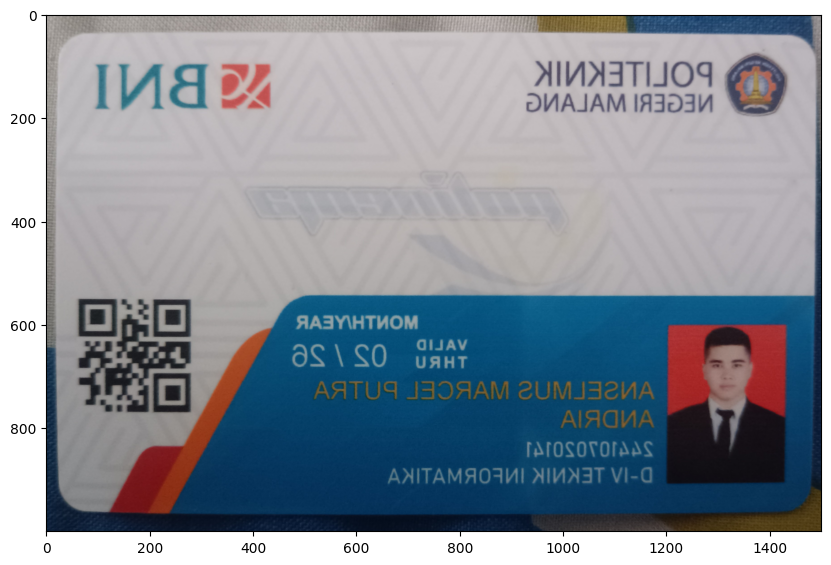

Shape setelah figsize : (1000, 1500, 3)


In [34]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
from skimage import io

#Pembuktian
print("Pembuktian")

#1
print("No. 1")

img = cv.imread('/content/drive/MyDrive/PCVK/ktm_crop.jpg')

# Ambil nilai piksel pada koordinat (y=100, x=100)
pixel_val = img[100, 100]

print("Array piksel OpenCV (BGR) :", pixel_val)
print(f"B: {pixel_val[0]}, G: {pixel_val[1]}, R: {pixel_val[2]}")

# Matplotlib menginterpretasikan array yang sama secara terbalik:
print("Interpretasi Matplotlib (RGB):")
print(f"R: {pixel_val[0]} (seharusnya B), G: {pixel_val[1]}, B: {pixel_val[2]} (seharusnya R)")

#2
print("No. 2")

canvas_16 = np.zeros(shape=(530, 530, 3), dtype=np.int16)
canvas_32 = np.zeros(shape=(530, 530, 3), dtype=np.int32)

print(f"int16 -> dtype: {canvas_16.dtype}, min: {canvas_16.min()}, max: {canvas_16.max()}, nbytes: {canvas_16.nbytes} bytes")
print(f"int32 -> dtype: {canvas_32.dtype}, min: {canvas_32.min()}, max: {canvas_32.max()}, nbytes: {canvas_32.nbytes} bytes")

#4
print("No. 4")

path = '/content/drive/MyDrive/PCVK/ktm_crop.jpg'

# 1. Menggunakan skimage
img_skimage = io.imread(path)

# 2. Menggunakan OpenCV + cvtColor
img_cv = cv.imread(path)
img_cv_rgb = cv.cvtColor(img_cv, cv.COLOR_BGR2RGB)

# Ambil piksel pada koordinat (100, 100)
print("Piksel skimage (RGB)        :", img_skimage[100, 100])
print("Piksel OpenCV cvtColor (RGB):", img_cv_rgb[100, 100])

# Cek kesamaan array secara menyeluruh
satu_persatu_sama = np.array_equal(img_skimage, img_cv_rgb)
print("Apakah seluruh array persis sama?:", satu_persatu_sama)

#5
print("No. 5")
print("Shape sebelum figsize :", imgFlip.shape)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1)
ax.imshow(imgFlip)
plt.show()

print("Shape setelah figsize :", imgFlip.shape) # Nilai dimensi matriks tetap sama

#Analisa
Pertanyaan: berapa banyak pixel + persen dari keseluruhan pixel pada gambar tersebut yang ketiga nilai R, G, dan B kurang dari 51?

In [35]:
import cv2 as cv
import numpy as np

# 1. Load citra
path_foto = '/content/drive/MyDrive/PCVK/ktm_crop.jpg'
img_bgr = cv.imread(path_foto)

# 2. Hitung total seluruh piksel (Tinggi x Lebar)
total_pixel = img_bgr.shape[0] * img_bgr.shape[1]

# 3. Ekstrak kanal warna B, G, R
# Catatan: OpenCV menyimpan dalam format BGR
B = img_bgr[:, :, 0]
G = img_bgr[:, :, 1]
R = img_bgr[:, :, 2]

# 4. Buat kondisi boolean: R < 51 DAN G < 51 DAN B < 51
kondisi_gelap = (R < 51) & (G < 51) & (B < 51)

# 5. Hitung jumlah piksel yang memenuhi kondisi
jumlah_pixel_gelap = np.sum(kondisi_gelap)

# 6. Hitung persentase terhadap total piksel
persentase = (jumlah_pixel_gelap / total_pixel) * 100

# 7. Tampilkan hasil
print(f"Resolusi Citra          : {img_bgr.shape[1]} x {img_bgr.shape[0]}")
print(f"Total Piksel            : {total_pixel:,} piksel")
print(f"Jumlah Piksel (RGB < 51): {jumlah_pixel_gelap:,} piksel")
print(f"Persentase              : {persentase:.2f}%")

Resolusi Citra          : 3455 x 2303
Total Piksel            : 7,956,865 piksel
Jumlah Piksel (RGB < 51): 405,024 piksel
Persentase              : 5.09%


Aplikasi
Studi kasus 1


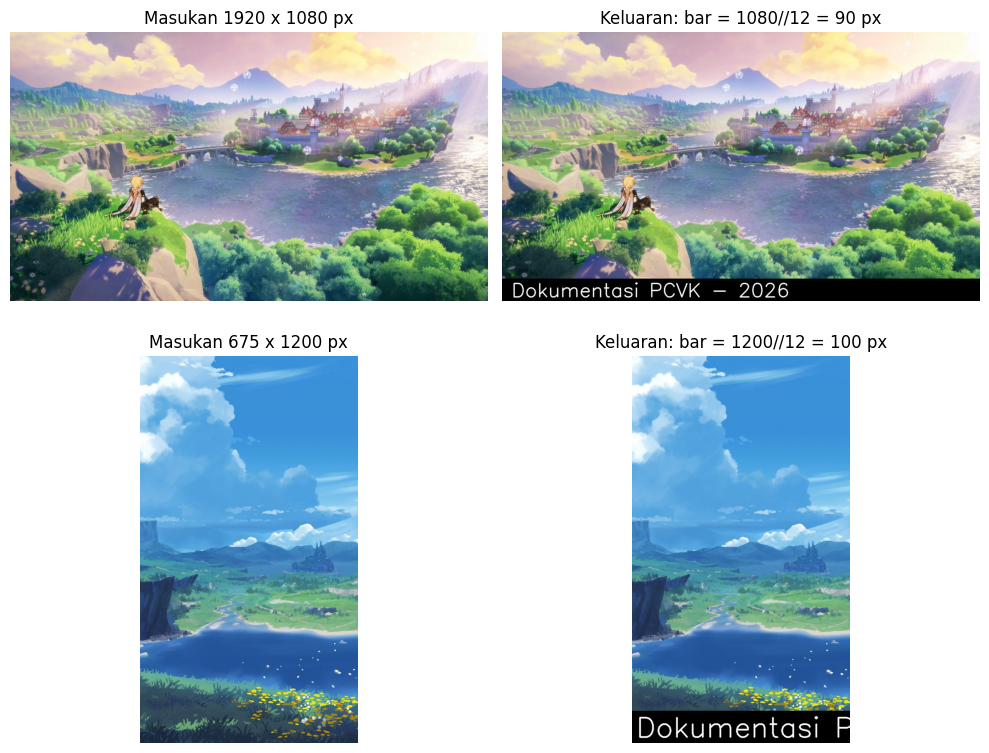

In [39]:
import cv2 as cv
import numpy as np

print("Aplikasi")

#studi kasus 1
print("Studi kasus 1")

def tambah_label_adaptif(img, teks="Dokumentasi PCVK - 2026"):
    # 1. Salin citra agar data asli tidak berubah
    img_out = img.copy()
    tinggi_img, lebar_img = img_out.shape[:2]

    # 2. Hitung tinggi bar secara proporsional (Tinggi // 12)
    tinggi_bar = tinggi_img // 12

    # 3. Gambarkan bar hitam pada bagian bawah citra
    # pt1: (0, tinggi - tinggi_bar), pt2: (lebar, tinggi)
    cv.rectangle(
        img_out,
        pt1=(0, tinggi_img - tinggi_bar),
        pt2=(lebar_img, tinggi_img),
        color=(0, 0, 0),
        thickness=-1
    )

    # 4. Hitung skala font dan ketebalan secara dinamik berpatokan pada tinggi bar
    font_face = cv.FONT_HERSHEY_SIMPLEX
    font_scale = tinggi_bar / 35.0  # Menyesuaikan skala huruf agar pas di bar
    thickness = max(1, int(font_scale * 1.5))

    # 5. Tentukan posisi teks di tengah bar secara vertikal
    (tek_w, tek_h), baseline = cv.getTextSize(teks, font_face, font_scale, thickness)
    margin_x = int(lebar_img * 0.02)  # Margin kiri 2% dari lebar citra
    posisi_y = tinggi_img - int((tinggi_bar - tek_h) / 2)

    # 6. Tambahkan teks putih pada bar
    cv.putText(
        img_out,
        text=teks,
        org=(margin_x, posisi_y),
        fontFace=font_face,
        fontScale=font_scale,
        color=(255, 255, 255),
        thickness=thickness,
        lineType=cv.LINE_AA
    )

    return img_out, tinggi_bar

import matplotlib.pyplot as plt

# Contoh pengujian dengan 2 citra berbeda ukuran
img1 = cv.imread('foto_landscape.jpg')  #landscape
img2 = cv.imread('foto_portrait.jpg')   #portrait

# Konversi BGR ke RGB untuk plotting matplotlib
img1_rgb = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2_rgb = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

# Eksekusi fungsi
out1, bar1 = tambah_label_adaptif(img1_rgb)
out2, bar2 = tambah_label_adaptif(img2_rgb)

# Tampilkan Hasil
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(img1_rgb)
plt.title(f"Masukan {img1.shape[1]} x {img1.shape[0]} px")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(out1)
plt.title(f"Keluaran: bar = {img1.shape[0]}//12 = {bar1} px")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img2_rgb)
plt.title(f"Masukan {img2.shape[1]} x {img2.shape[0]} px")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(out2)
plt.title(f"Keluaran: bar = {img2.shape[0]}//12 = {bar2} px")
plt.axis('off')

plt.tight_layout()
plt.show()

Studi kasus 2


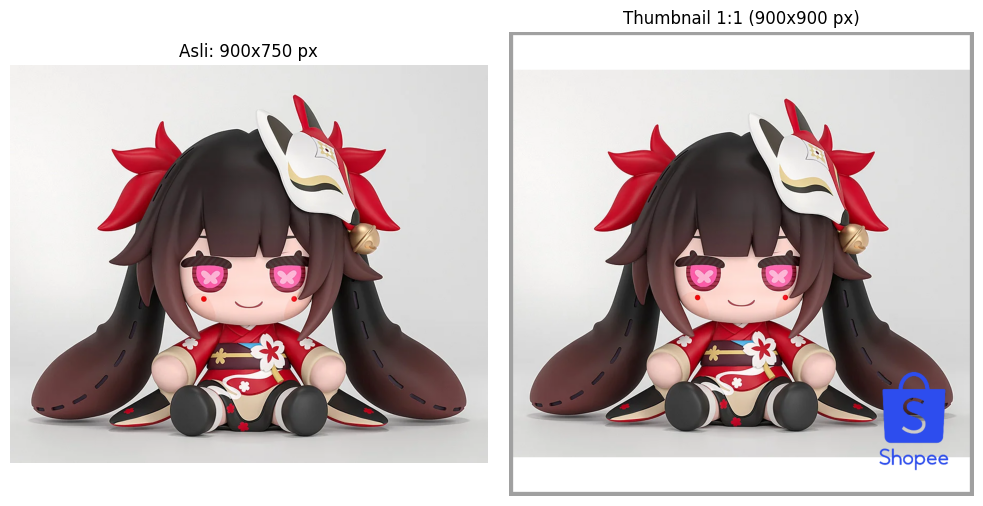

In [42]:
import cv2 as cv
import numpy as np

#studi kasus 2
print("Studi kasus 2")

def buat_thumbnail_persegi(img, logo=None, warna_kanvas=(255, 255, 255), warna_border=(160, 160, 160), tebal_border_persen=0.015):

    tinggi_asli, lebar_asli = img.shape[:2]

    # 1. Tentukan ukuran kanvas persegi berdasarkan dimensi terbesar
    sisi_kanvas = max(tinggi_asli, lebar_asli)

    # 2. Buat kanvas polos berukuran 1:1 (default: Putih)
    kanvas = np.full((sisi_kanvas, sisi_kanvas, 3), warna_kanvas, dtype=np.uint8)

    # 3. Hitung koordinat offset agar citra tepat di tengah kanvas
    offset_x = (sisi_kanvas - lebar_asli) // 2
    offset_y = (sisi_kanvas - tinggi_asli) // 2

    # Tempelkan citra asli ke tengah kanvas
    kanvas[offset_y:offset_y + tinggi_asli, offset_x:offset_x + lebar_asli] = img

    # 4. Tambahkan bingkai/border abu-abu di pinggir luar
    tebal_border = max(2, int(sisi_kanvas * tebal_border_persen))
    cv.rectangle(
        kanvas,
        pt1=(0, 0),
        pt2=(sisi_kanvas - 1, sisi_kanvas - 1),
        color=warna_border,
        thickness=tebal_border
    )

    # 5. Tambahkan logo
    if logo is not None:
        lebar_logo_target = int(sisi_kanvas * 0.15)
        rasio_logo = lebar_logo_target / logo.shape[1]
        tinggi_logo_target = int(logo.shape[0] * rasio_logo)

        logo_resized = cv.resize(logo, (lebar_logo_target, tinggi_logo_target))

        margin = int(sisi_kanvas * 0.04) + tebal_border
        pos_y_start = sisi_kanvas - tinggi_logo_target - margin
        pos_y_end = sisi_kanvas - margin
        pos_x_start = sisi_kanvas - lebar_logo_target - margin
        pos_x_end = sisi_kanvas - margin

        if logo_resized.shape[2] == 4:
            alpha = logo_resized[:, :, 3] / 255.0
            alpha_3d = np.dstack([alpha] * 3)
            logo_rgb = logo_resized[:, :, :3]

            roi = kanvas[pos_y_start:pos_y_end, pos_x_start:pos_x_end]
            kanvas[pos_y_start:pos_y_end, pos_x_start:pos_x_end] = (
                alpha_3d * logo_rgb + (1 - alpha_3d) * roi
            ).astype(np.uint8)
        else:
            kanvas[pos_y_start:pos_y_end, pos_x_start:pos_x_end] = logo_resized

    return kanvas

    import matplotlib.pyplot as plt

# 1. Baca citra produk
img_produk = cv.imread('foto_produk.jpg')
img_produk_rgb = cv.cvtColor(img_produk, cv.COLOR_BGR2RGB)

# 2. Baca logo toko
logo_toko = cv.imread('logo_toko.png', cv.IMREAD_UNCHANGED)

# Jika logo dalam BGR biasa, konversi ke RGB
if logo_toko.shape[2] == 3:
    logo_toko = cv.cvtColor(logo_toko, cv.COLOR_BGR2RGB)

# 3. Jalankan fungsi thumbnail
thumbnail_1to1 = buat_thumbnail_persegi(
    img_produk_rgb,
    logo=logo_toko,
    warna_kanvas=(255, 255, 255) # Putih bersih
)

# 4. Tampilkan Hasil
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_produk_rgb)
plt.title(f"Asli: {img_produk_rgb.shape[1]}x{img_produk_rgb.shape[0]} px")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(thumbnail_1to1)
plt.title(f"Thumbnail 1:1 ({thumbnail_1to1.shape[1]}x{thumbnail_1to1.shape[0]} px)")
plt.axis('off')

plt.tight_layout()
plt.show()